In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install segmentation_models_pytorch

In [3]:
pip install rasterio

In [4]:
import os
import cv2
import numpy as np
import rasterio
import glob
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch

In [5]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

test_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        mask = (mask > 0).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image, mask = augmented["image"], augmented["mask"]

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 8, pin_memory = False, shuffle = True, num_workers = 8)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[ 0.1254,  0.3309, -0.4226,  ..., -0.5424, -0.5938, -0.6281],
         [ 0.0398,  0.3138, -0.0801,  ..., -0.5596, -0.5938, -0.6109],
         [-0.0629, -0.0287, -0.4054,  ..., -0.5938, -0.5767, -0.5596],
         ...,
         [-1.7412, -1.3987, -1.4500,  ..., -1.7412, -1.6384, -1.6042],
         [-1.8610, -1.3644, -1.2103,  ..., -1.9295, -1.6898, -1.5357],
         [-1.7583, -1.2788, -1.1075,  ..., -1.4329, -1.5699, -1.8782]],

        [[ 0.2927,  0.5028, -0.2675,  ..., -0.7402, -0.7402, -0.7752],
         [ 0.2052,  0.4853,  0.0826,  ..., -0.7577, -0.7402, -0.7577],
         [ 0.1001,  0.1352, -0.2500,  ..., -0.7927, -0.7752, -0.7577],
         ...,
         [-1.4230, -1.0728, -1.1253,  ..., -1.3704, -1.2654, -1.2304],
         [-1.5455, -1.0378, -0.8803,  ..., -1.5630, -1.3179, -1.1604],
         [-1.4405, -0.9503, -0.7752,  ..., -1.0553, -1.1954, -1.5105]],

        [[ 0.4265,  0.6356, -0.1312,  ..., -0.5844, -0.6018, -0.6367],
         [ 0.3393,  0.6182,  0.2173,  ..., -0

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 1, 1,  ..., 1, 1, 1],
        [0, 1, 1,  ..., 1, 1, 1],
        [0, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)
torch.Size([256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[-1.3473, -1.4500, -1.4672,  ..., -0.5596, -0.2856, -1.2788],
         [-1.0390, -1.1418, -1.2103,  ..., -0.8507, -0.9192, -1.4158],
         [-0.9192, -0.9877, -1.0733,  ..., -1.5014, -1.3815, -1.0562],
         ...,
         [ 0.8789,  0.8961,  0.9303,  ..., -0.9363, -0.9705, -1.5699],
         [ 0.8789,  0.8961,  0.9132,  ..., -1.6384, -1.6555, -1.5185],
         [ 0.8618,  0.8789,  0.8961,  ..., -1.7412, -1.9809, -1.6555]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.4076, -0.0924, -1.1078],
         [-0.8803, -0.9853, -1.0553,  ..., -0.6527, -0.7402, -1.2129],
         [-0.7402, -0.8102, -0.8978,  ..., -1.3004, -1.1779, -0.7927],
         ...,
         [ 1.0280,  1.0455,  1.0805,  ..., -0.6877, -0.7227, -1.3354],
         [ 1.0280,  1.0455,  1.0630,  ..., -1.4055, -1.4405, -1.3004],
         [ 1.0105,  1.0280,  1.0455,  ..., -1.5105, -1.7731, -1.4405]],

        [[-1.1596, -1.2641, -1.2816,  ..., -0.2358,  0.1128, -0.8981],
         [-0.8458, -0.9504, -1.0201,  ..., -0

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[-0.8507, -1.0390, -1.1247,  ..., -1.4672, -1.2788, -1.2617],
         [-1.0733, -0.9192, -1.3130,  ..., -1.5014, -1.4500, -1.5357],
         [-1.0390, -0.6965, -1.1589,  ..., -1.3473, -1.3987, -1.5014],
         ...,
         [-1.3644, -1.3473, -1.3644,  ..., -0.9705, -0.6965, -0.9363],
         [-1.3987, -1.3644, -1.3644,  ..., -0.5253, -0.6452, -0.7993],
         [-1.4158, -1.3815, -1.3644,  ..., -0.9534, -0.6281, -0.5767]],

        [[-0.5126, -0.7052, -0.8102,  ..., -1.0028, -0.8102, -0.7927],
         [-0.7402, -0.5826, -1.0028,  ..., -1.0378, -0.9853, -1.0728],
         [-0.7052, -0.3550, -0.8277,  ..., -0.8803, -0.9328, -1.0378],
         ...,
         [-0.9153, -0.8978, -0.9153,  ..., -0.5301, -0.3375, -0.5826],
         [-0.9503, -0.9153, -0.9153,  ..., -0.0749, -0.2850, -0.4426],
         [-0.9678, -0.9328, -0.9153,  ..., -0.5126, -0.2675, -0.2150]],

        [[-0.4624, -0.6541, -0.7936,  ..., -0.8981, -0.7064, -0.6890],
         [-0.6890, -0.5321, -0.9853,  ..., -0

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[0, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 0, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)
torch.Size([256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256]

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [22]:
for img, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [23]:
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.nn.functional as F

class ChannelSELayer(nn.Module):
    def __init__(self, num_channels, reduction_ratio = 16):
        super(ChannelSELayer, self).__init__()
        num_channels_reduced = max(1, num_channels // reduction_ratio)
        self.fc1 = nn.Linear(num_channels, num_channels_reduced, bias = True)
        self.fc2 = nn.Linear(num_channels_reduced, num_channels, bias = True)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor):
        batch_size, num_channels, H, W = input_tensor.size()

        squeeze_tensor = input_tensor.view(batch_size, num_channels, -1).mean(dim = 2)

        fc_out_1 = self.relu(self.fc1(squeeze_tensor))
        fc_out_2 = self.sigmoid(self.fc2(fc_out_1))

        return input_tensor * fc_out_2.view(batch_size, num_channels, 1, 1)

class CustomDeepLabV3(nn.Module):
    def __init__(self, encoder_name = "resnet101", encoder_weights = "imagenet", in_channels = 3, classes = 1):
        super(CustomDeepLabV3, self).__init__()
        self.base_model = smp.DeepLabV3(
            encoder_name = encoder_name,
            encoder_weights = encoder_weights,
            in_channels = in_channels,
            classes = 256,
            activation = None
        )

        self.head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = True),
            ChannelSELayer(128),
            nn.Dropout2d(0.5),
            nn.Conv2d(128, 64, 3, padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = True),
            ChannelSELayer(64),
            nn.Dropout2d(0.5),
            nn.Conv2d(64, classes, 1)
        )

    def forward(self, x):
        x = self.base_model(x)
        x = self.head(x)
        return x

def batchnorm_to_groupnorm(model, num_groups = 32):
    for name, module in model.named_children():
        if isinstance(module, nn.BatchNorm2d):
            num_features = module.num_features
            valid_num_groups = min(num_groups, num_features)
            while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                valid_num_groups -= 1
            setattr(model, name, nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features))
        else:
            batchnorm_to_groupnorm(module, num_groups)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

deeplab_model = CustomDeepLabV3(
    encoder_name = "resnet101",
    encoder_weights = "imagenet",
    in_channels = 3,
    classes = 1
)

deeplab_model = batchnorm_to_groupnorm(deeplab_model)
deeplab_model.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


CustomDeepLabV3(
  (base_model): DeepLabV3(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          

In [24]:
def calc_iou(pred, gt):
    with torch.no_grad():
        pred = (pred.sigmoid() > 0.5).long()
        pred, gt = pred.contiguous().view(-1), gt.contiguous().view(-1)

        if gt.sum() == 0:
          if pred.sum() == 0:
            return 1.0
          else:
            return 0.0

        intersect = torch.logical_and(pred > 0, gt > 0).sum().float().item()
        union = torch.logical_or(pred > 0, gt > 0).sum().float().item()

        iou = (intersect + 1e-6) / (union + 1e-6)

    return iou

In [25]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.0 * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)

        bce = F.binary_cross_entropy(inputs, targets, reduction = 'none')
        pt = torch.exp(-bce)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce).mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [26]:
!pip install optuna

In [27]:
import torch.optim as optim
from tqdm import tqdm
import optuna
import warnings
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CosineAnnealingLR

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.Adam(model.parameters(), lr = 0.0001)

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, images_path, masks_path in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = loss_func(outputs, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(outputs, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch+1}/{num_epoch}:")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")

        model.eval()
        val_loss = 0
        val_total_iou = 0

        with torch.no_grad():
            for val_images, val_masks, val_images_path, val_masks_path in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                val_output = model(val_images)
                val_loss += loss_func(val_output, val_masks.float()).item()

                val_batch_iou = calc_iou(val_output, val_masks)
                val_total_iou += val_batch_iou

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_total_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [28]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(1.0, 0.0), (0.7, 0.3), (0.5, 0.5), (0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    deeplab_model = CustomDeepLabV3(
        encoder_name = "resnet101",
        encoder_weights = "imagenet",
        in_channels = 3,
        classes = 1
    )

    deeplab_model = batchnorm_to_groupnorm(deeplab_model)
    deeplab_model.to(device)

    model, val_loss = train_model(
        model = deeplab_model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = model

    return val_loss

In [29]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(1.0, 0.0)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-20 03:51:38,188] A new study created in memory with name: no-name-90ccca7a-87e5-4c4e-855b-4cc16faa8d5b


Trial 0: scheduler = cosine, dice weight = 1.0, focal weight = 0.0



100%|██████████| 18/18 [00:26<00:00,  1.45s/it]


Epoch 1/25:
Train loss: 0.43509304854604935, Train Avg IoU: 0.48648501505164254



100%|██████████| 3/3 [00:01<00:00,  1.69it/s]


Val loss: 0.3619818886121114, Val Avg IoU: 0.5826619466158934



100%|██████████| 18/18 [00:24<00:00,  1.34s/it]


Epoch 2/25:
Train loss: 0.3965708580281999, Train Avg IoU: 0.5292075454734426



100%|██████████| 3/3 [00:01<00:00,  1.92it/s]


Val loss: 0.337301770846049, Val Avg IoU: 0.6511008332027871



100%|██████████| 18/18 [00:24<00:00,  1.36s/it]


Epoch 3/25:
Train loss: 0.36175210277239483, Train Avg IoU: 0.6416833811949558



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.31055939197540283, Val Avg IoU: 0.7333749813789318



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 4/25:
Train loss: 0.34812139802508885, Train Avg IoU: 0.7045571700277204



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.2946649392445882, Val Avg IoU: 0.8013168849059301



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 5/25:
Train loss: 0.32145824697282577, Train Avg IoU: 0.7463230362754962



100%|██████████| 3/3 [00:01<00:00,  1.97it/s]


Val loss: 0.27717405557632446, Val Avg IoU: 0.8009426090057916



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 6/25:
Train loss: 0.31850841641426086, Train Avg IoU: 0.7503574245123006



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.26737425724665326, Val Avg IoU: 0.7967563480558387



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 7/25:
Train loss: 0.30051186349656844, Train Avg IoU: 0.7555895343115864



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.2520270148913066, Val Avg IoU: 0.8043925707104881



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 8/25:
Train loss: 0.28634804487228394, Train Avg IoU: 0.7818250891903423



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.241447647412618, Val Avg IoU: 0.8190263793344411



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 9/25:
Train loss: 0.2775131795141432, Train Avg IoU: 0.7930426793637247



100%|██████████| 3/3 [00:01<00:00,  1.99it/s]


Val loss: 0.2355508009592692, Val Avg IoU: 0.8294567057178522



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 10/25:
Train loss: 0.27655858794848126, Train Avg IoU: 0.7831986472483936



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.23599370320638022, Val Avg IoU: 0.8117395658332964



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 11/25:
Train loss: 0.26514706677860683, Train Avg IoU: 0.7940534821980334



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.23042800029118857, Val Avg IoU: 0.8208323211654126



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 12/25:
Train loss: 0.2585385176870558, Train Avg IoU: 0.8000122375986342



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.22383294502894083, Val Avg IoU: 0.8326387933340126



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 13/25:
Train loss: 0.25225675106048584, Train Avg IoU: 0.8049358277097369



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.22177018721898398, Val Avg IoU: 0.8280895065584543



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 14/25:
Train loss: 0.2495079901483324, Train Avg IoU: 0.814700291925409



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.21811417738596597, Val Avg IoU: 0.8322993483037759



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 15/25:
Train loss: 0.24571985668606228, Train Avg IoU: 0.8151196925891451



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.21439423163731894, Val Avg IoU: 0.8404251979265527



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 16/25:
Train loss: 0.24725046091609532, Train Avg IoU: 0.8133931417527234



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.21499818563461304, Val Avg IoU: 0.832732539074053



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.24854146440823874, Train Avg IoU: 0.8160488535604622



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.21103835105895996, Val Avg IoU: 0.8382256334615791



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 18/25:
Train loss: 0.2429225742816925, Train Avg IoU: 0.8161283464779807



100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


Val loss: 0.21182696024576822, Val Avg IoU: 0.8383689045011365



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 19/25:
Train loss: 0.24162270625432333, Train Avg IoU: 0.8112518595476286



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.2088155746459961, Val Avg IoU: 0.8435810081215814



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 20/25:
Train loss: 0.23745189441574943, Train Avg IoU: 0.8200191951567357



100%|██████████| 3/3 [00:01<00:00,  1.64it/s]


Val loss: 0.20883737007776895, Val Avg IoU: 0.8394968559596737



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 21/25:
Train loss: 0.23974034852451748, Train Avg IoU: 0.8220544588682446



100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


Val loss: 0.20922205845514932, Val Avg IoU: 0.8377925767308025



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 22/25:
Train loss: 0.23801890346739027, Train Avg IoU: 0.8253143162913799



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.20838930209477743, Val Avg IoU: 0.8379407413740383



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 23/25:
Train loss: 0.23450760377777946, Train Avg IoU: 0.8211357301341815



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.20735939343770346, Val Avg IoU: 0.8407307381339096



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 24/25:
Train loss: 0.23152096403969658, Train Avg IoU: 0.8246256109677815



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.2072147329648336, Val Avg IoU: 0.8409700873898805



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.23748942216237387, Train Avg IoU: 0.8263218149380879



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]
[I 2025-11-20 04:02:42,612] Trial 0 finished with value: 0.20719844102859497 and parameters: {'scheduler': 'cosine', 'loss_weight': (1.0, 0.0)}. Best is trial 0 with value: 0.20719844102859497.


Val loss: 0.20719844102859497, Val Avg IoU: 0.8408560652642724

Trial 1: scheduler = reducelr, dice weight = 1.0, focal weight = 0.0



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 1/25:
Train loss: 0.4725554651684231, Train Avg IoU: 0.44899889356501343



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.4027712146441142, Val Avg IoU: 0.5809186149936683



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 2/25:
Train loss: 0.43272797266642254, Train Avg IoU: 0.5144876562004802



100%|██████████| 3/3 [00:01<00:00,  1.95it/s]


Val loss: 0.3751741647720337, Val Avg IoU: 0.6151751626650471



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 3/25:
Train loss: 0.3913341230816311, Train Avg IoU: 0.6172064276113208



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.33213990926742554, Val Avg IoU: 0.6935025887698503



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 4/25:
Train loss: 0.36114908589257133, Train Avg IoU: 0.6804268098460653



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.30666693051656085, Val Avg IoU: 0.7627203010366594



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 5/25:
Train loss: 0.3442896074718899, Train Avg IoU: 0.7270084280101913



100%|██████████| 3/3 [00:02<00:00,  1.41it/s]


Val loss: 0.29421250025431317, Val Avg IoU: 0.8064620277403577



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 6/25:
Train loss: 0.3209981454743279, Train Avg IoU: 0.7542410733089427



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.2935723662376404, Val Avg IoU: 0.7994626233453586



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 7/25:
Train loss: 0.32908447583516437, Train Avg IoU: 0.7350961279988183



100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


Val loss: 0.28025639057159424, Val Avg IoU: 0.8027150250210484



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 8/25:
Train loss: 0.31948120726479423, Train Avg IoU: 0.750633096029056



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.2746986548105876, Val Avg IoU: 0.803644943620724



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 9/25:
Train loss: 0.30615102913644576, Train Avg IoU: 0.7655887654270908



100%|██████████| 3/3 [00:01<00:00,  1.90it/s]


Val loss: 0.2659148971239726, Val Avg IoU: 0.8225078316139939



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 10/25:
Train loss: 0.29536424411667717, Train Avg IoU: 0.7824115774722288



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.2569867769877116, Val Avg IoU: 0.8321934081238208



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 11/25:
Train loss: 0.2868160340521071, Train Avg IoU: 0.7939974104697516



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.2590234676996867, Val Avg IoU: 0.808629032621321



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 12/25:
Train loss: 0.2817761301994324, Train Avg IoU: 0.8016855518164386



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.24605353673299155, Val Avg IoU: 0.8325234989658892



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 13/25:
Train loss: 0.2771601246462928, Train Avg IoU: 0.7943054425606013



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.2414659857749939, Val Avg IoU: 0.8340259296043354



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 14/25:
Train loss: 0.27430981397628784, Train Avg IoU: 0.7853025164419141



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.24108678102493286, Val Avg IoU: 0.8220987162274659



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 15/25:
Train loss: 0.26517052782906425, Train Avg IoU: 0.8060439878231062



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.239329993724823, Val Avg IoU: 0.8145127901721878



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 16/25:
Train loss: 0.2621508141358693, Train Avg IoU: 0.8002808167330865



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.232526163260142, Val Avg IoU: 0.831764189995245



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.25841324196921456, Train Avg IoU: 0.8049479639097088



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.2218760848045349, Val Avg IoU: 0.8408513177863605



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 18/25:
Train loss: 0.25205806228849625, Train Avg IoU: 0.8110743711823424



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.21909844875335693, Val Avg IoU: 0.8399270751201925



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 19/25:
Train loss: 0.25345216857062447, Train Avg IoU: 0.7835301018780675



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.2147140900293986, Val Avg IoU: 0.8390109791608126



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 20/25:
Train loss: 0.24635397725635105, Train Avg IoU: 0.8070021885218677



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.2117833693822225, Val Avg IoU: 0.8379435527911814



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 21/25:
Train loss: 0.23666548397805956, Train Avg IoU: 0.8133129377847247



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.2061371405919393, Val Avg IoU: 0.8430216835481269



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 22/25:
Train loss: 0.23555969529681736, Train Avg IoU: 0.8199414093940591



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.20416502157847086, Val Avg IoU: 0.8381980999819912



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 23/25:
Train loss: 0.2264864146709442, Train Avg IoU: 0.8233979979276981



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.20154605309168497, Val Avg IoU: 0.8416114523047309



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 24/25:
Train loss: 0.22610914707183838, Train Avg IoU: 0.823217488173383



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.20102282365163168, Val Avg IoU: 0.8280683551400431



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.21777746081352234, Train Avg IoU: 0.824436902651553



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]
[I 2025-11-20 04:13:46,208] Trial 1 finished with value: 0.19112573067347208 and parameters: {'scheduler': 'reducelr', 'loss_weight': (1.0, 0.0)}. Best is trial 1 with value: 0.19112573067347208.


Val loss: 0.19112573067347208, Val Avg IoU: 0.8477104333126863

Trial 2: scheduler = steplr, dice weight = 1.0, focal weight = 0.0



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 1/25:
Train loss: 0.43140121301015216, Train Avg IoU: 0.4996454820895806



100%|██████████| 3/3 [00:01<00:00,  1.86it/s]


Val loss: 0.36633503437042236, Val Avg IoU: 0.5827804663904814



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 2/25:
Train loss: 0.39115481906467015, Train Avg IoU: 0.5683211544728687



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.32069075107574463, Val Avg IoU: 0.6951430130550108



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 3/25:
Train loss: 0.35279836919572616, Train Avg IoU: 0.6796230012908381



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.2950170636177063, Val Avg IoU: 0.7756684042901161



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 4/25:
Train loss: 0.3405781388282776, Train Avg IoU: 0.7045976666054024



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.29344473282496136, Val Avg IoU: 0.7380286120670126



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 5/25:
Train loss: 0.3272208074728648, Train Avg IoU: 0.698341454966562



100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


Val loss: 0.28057678540547687, Val Avg IoU: 0.7680666251606514



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 6/25:
Train loss: 0.3198058472739326, Train Avg IoU: 0.7262697648931905



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.2739827831586202, Val Avg IoU: 0.7968899139381653



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 7/25:
Train loss: 0.31391921639442444, Train Avg IoU: 0.751502926882345



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.2701454758644104, Val Avg IoU: 0.8096915672618491



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 8/25:
Train loss: 0.30987103117836845, Train Avg IoU: 0.7586667348426902



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.26857741673787433, Val Avg IoU: 0.799424647661474



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 9/25:
Train loss: 0.30408626463678146, Train Avg IoU: 0.7692994676795056



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.26520365476608276, Val Avg IoU: 0.8012767745333172



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 10/25:
Train loss: 0.29925231138865155, Train Avg IoU: 0.7751073458843298



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.2627698977788289, Val Avg IoU: 0.7966645916779255



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 11/25:
Train loss: 0.299145370721817, Train Avg IoU: 0.7746023249917708



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.2573218544324239, Val Avg IoU: 0.8186874518793957



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 12/25:
Train loss: 0.2890794608328078, Train Avg IoU: 0.7883756764309933



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.2551948626836141, Val Avg IoU: 0.8206556359226833



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 13/25:
Train loss: 0.29324371616045636, Train Avg IoU: 0.7935329214334955



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.25272361437479657, Val Avg IoU: 0.8268962359041786



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 14/25:
Train loss: 0.28538286685943604, Train Avg IoU: 0.7950430739205668



100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


Val loss: 0.25410256783167523, Val Avg IoU: 0.8160727717335506



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 15/25:
Train loss: 0.2925357719262441, Train Avg IoU: 0.7885804997161744



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.2505216797192891, Val Avg IoU: 0.8303378015885271



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 16/25:
Train loss: 0.2841709587309096, Train Avg IoU: 0.7976309766739561



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.2489888072013855, Val Avg IoU: 0.8308938180241618



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.2845734589629703, Train Avg IoU: 0.803204317324413



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.24864816665649414, Val Avg IoU: 0.8299499908589191



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 18/25:
Train loss: 0.2819875611199273, Train Avg IoU: 0.8034044175256103



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.2492579221725464, Val Avg IoU: 0.8210296362205818



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 19/25:
Train loss: 0.28640110625161064, Train Avg IoU: 0.7996470636262745



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.25002092123031616, Val Avg IoU: 0.8154118309609504



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 20/25:
Train loss: 0.2808305554919773, Train Avg IoU: 0.8034101033896756



100%|██████████| 3/3 [00:01<00:00,  1.90it/s]


Val loss: 0.24719164768854776, Val Avg IoU: 0.8261151269301998



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 21/25:
Train loss: 0.27776721451017594, Train Avg IoU: 0.8106733302505744



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.24761048952738443, Val Avg IoU: 0.8229524656781827



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 22/25:
Train loss: 0.27679039041201275, Train Avg IoU: 0.8094190757375754



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.24606098731358847, Val Avg IoU: 0.8301356394444385



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 23/25:
Train loss: 0.2765658696492513, Train Avg IoU: 0.8083177756239253



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.24534444014231363, Val Avg IoU: 0.8329009083110229



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 24/25:
Train loss: 0.280263086160024, Train Avg IoU: 0.8045552191078976



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.2454072634379069, Val Avg IoU: 0.8300991286154744



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.2816683285766178, Train Avg IoU: 0.8080459897026459



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]
[I 2025-11-20 04:24:49,902] Trial 2 finished with value: 0.24528912703196207 and parameters: {'scheduler': 'steplr', 'loss_weight': (1.0, 0.0)}. Best is trial 1 with value: 0.19112573067347208.


Val loss: 0.24528912703196207, Val Avg IoU: 0.8282884983323714



In [30]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (1.0, 0.0)}
Best val loss: 0.19112573067347208


In [31]:
fine_tune_model.eval()

CustomDeepLabV3(
  (base_model): DeepLabV3(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          

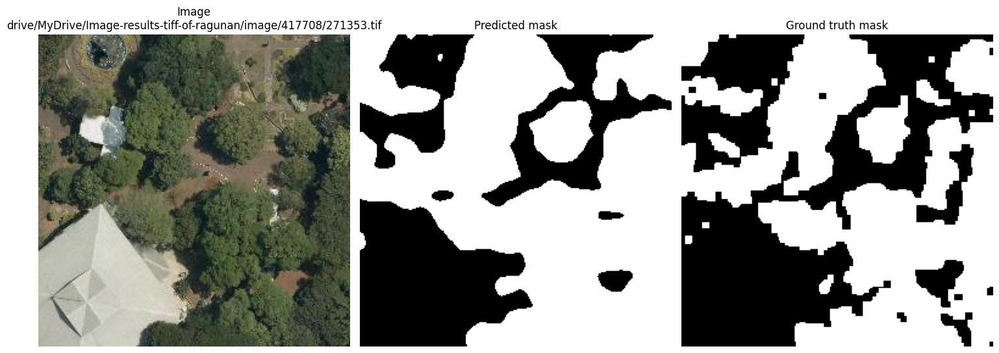

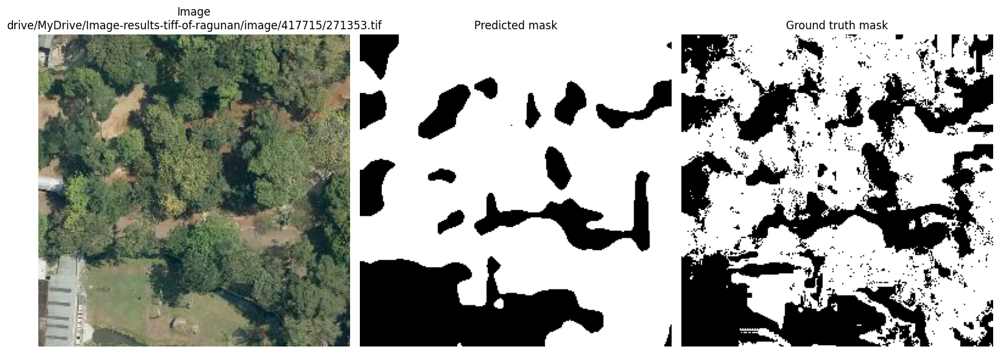

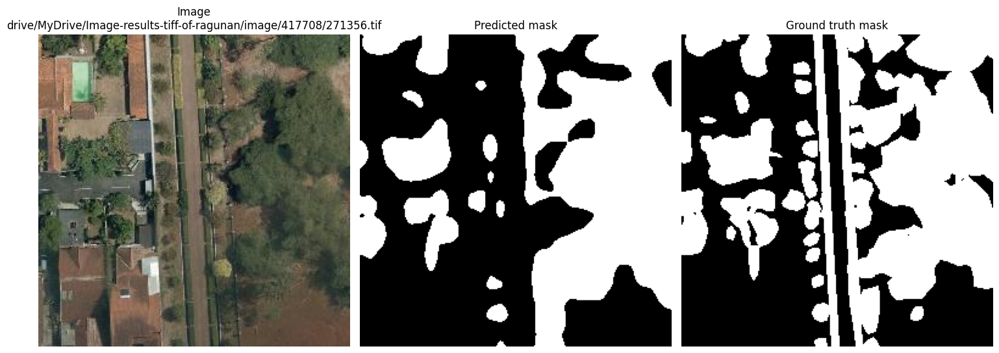

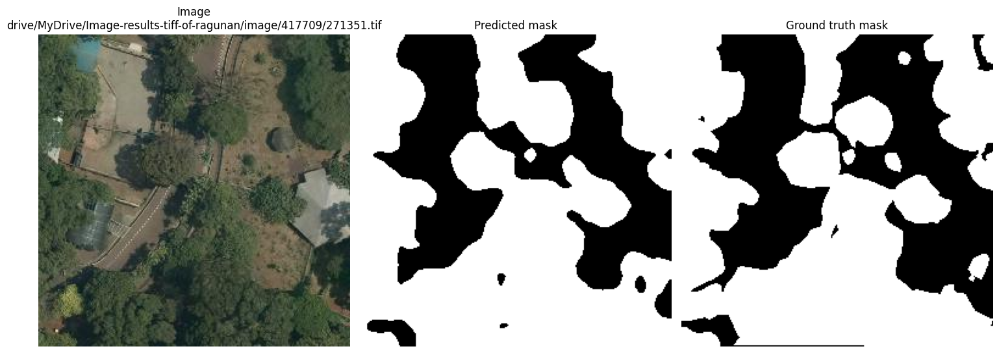

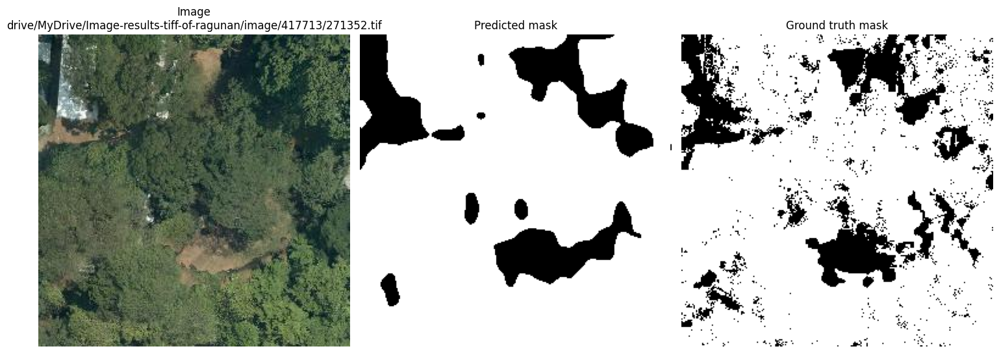

...

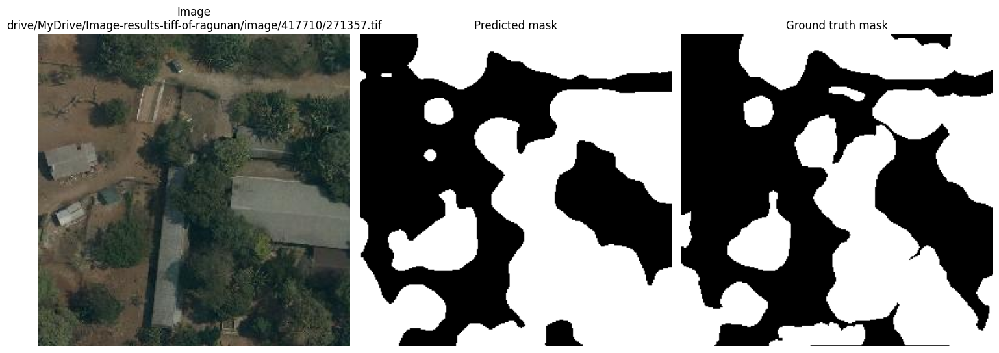

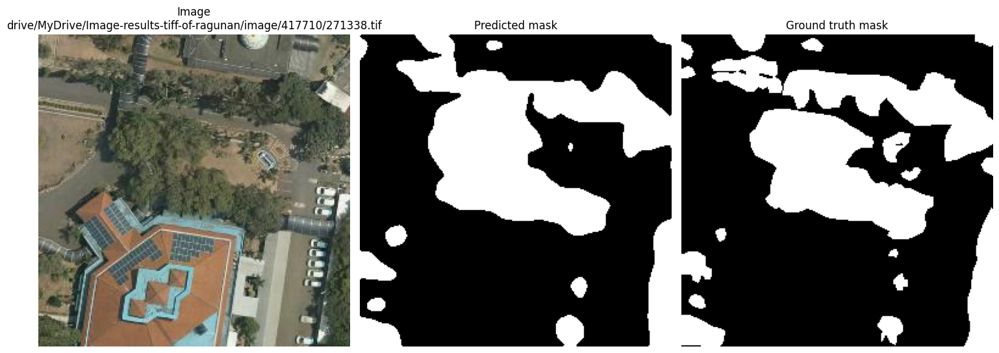

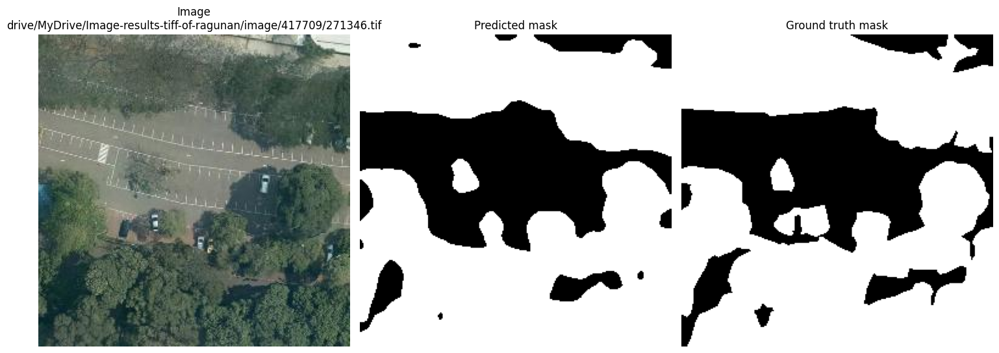

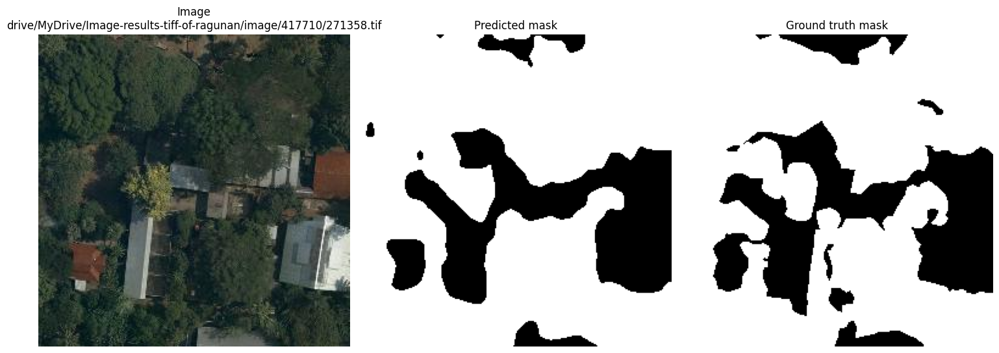

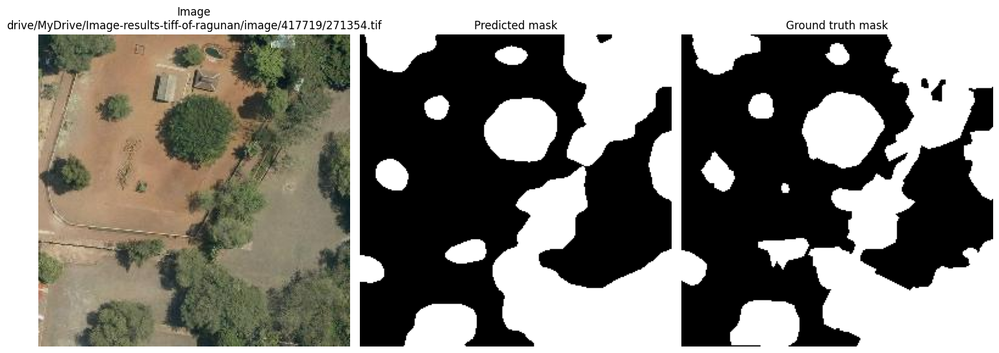

In [32]:
pred_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for image, mask, image_path, mask_path in test_loader:
        image = image.to(device)
        mask = mask.to(device)

        output = fine_tune_model(image)
        output = torch.sigmoid(output)
        pred_mask = (output > 0.5).float()

        for i in range(len(image_path)):
            img = image[i].cpu()
            img_path = image_path[i]

            if img.shape[0] == 1:
                img = img.squeeze(0).numpy()
            elif img.shape[0] == 3:
                img = img.permute(1, 2, 0).numpy()

            gt_mask = mask[i].cpu().squeeze().numpy()
            predicted_mask = pred_mask[i].cpu().squeeze().numpy()

            orig_image = Image.open(img_path).convert("RGB")
            orig_image = np.array(orig_image)

            gt_masks.append(gt_mask)
            pred_masks.append(predicted_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(orig_image)
            plt.axis("off")
            plt.title(f"Image\n{image_path[i]}")

            plt.subplot(1, 3, 2)
            plt.imshow(predicted_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Predicted mask")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Ground truth mask")

            plt.tight_layout()
            plt.show()

In [33]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    iou = intersection / union
    return iou

In [34]:
iou_scores = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    pred_mask = (pred_masks[i] > 0.5).astype(np.uint8)
    gt_mask = (gt_masks[i] > 0.5).astype(np.uint8)

    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    pixels = np.sum(pred_mask == 1)
    veg_area = pixels * (GSD_x * GSD_y)
    iou_score = calculate_iou(pred_mask, gt_mask)

    iou_scores.append(iou_score)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou_score}")
    print("=====================================================")

print("=====================================================")
print(f"Average IoU score: {np.mean(iou_scores)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 41887
Vegetation coverage area: 23575.25656373376
IoU score: 0.8004823607301618
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 46809
Vegetation coverage area: 3637.4304851779384
IoU score: 0.7451602473426828
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 28049
Vegetation coverage area: 15786.816228332615
IoU score: 0.714507459254362
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 42395
Vegetation coverage area: 23861.174159512324
IoU score: 0.8547536225206754
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 54303
Ve

In [37]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 23575.25656373376 m^2
Carbon density: 0.007000032494108365 ton/m^2
Estimated carbon stock: 165.02756200307783 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3637.4304851779384 m^2
Carbon density: 0.007000032494108365 ton/m^2
Estimated carbon stock: 25.462131591305926 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 15786.816228332615 m^2
Carbon density: 0.007000032494108365 ton/m^2
Estimated carbon stock: 110.50822657684557 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 23861.174159512324 m^2
Carbon density: 0.007000032494108365 ton/m^2
Estimated carbon stock: 167.02899446416512 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4219.773710966216 m^2
Carbon density: 0.0